<a href="https://colab.research.google.com/github/liviaceciliags/GoldFever/blob/main/train_yolov12n.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

[![Roboflow Notebooks](https://media.roboflow.com/notebooks/template/bannertest2-2.png?ik-sdk-version=javascript-1.4.3&updatedAt=1672932710194)](https://github.com/roboflow/notebooks)

# How to Train YOLOv12 Object Detection on a Custom Dataset

---

[![Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/roboflow-ai/notebooks/blob/main/notebooks/train-yolov12-object-detection-model.ipynb)
[![arXiv](https://img.shields.io/badge/arXiv-2502.12524-b31b1b.svg)](https://arxiv.org/abs/2502.12524)
[![Roboflow](https://raw.githubusercontent.com/roboflow-ai/notebooks/main/assets/badges/roboflow-blogpost.svg)](https://blog.roboflow.com/train-yolov12-model)
[![GitHub](https://badges.aleen42.com/src/github.svg)](https://github.com/sunsmarterjie/yolov12)

[YOLOv12](https://github.com/sunsmarterjie/yolov12) is a newly proposed attention-centric variant of the YOLO family that focuses on incorporating efficient attention mechanisms into the backbone while preserving real-time performance. Instead of relying heavily on CNN-based architectures like its predecessors, YOLOv12 introduces a simple yet powerful “area attention” module, which strategically partitions the feature map to reduce the quadratic complexity of full self-attention. It also adopts residual efficient layer aggregation networks (R-ELAN) to enhance feature aggregation and training stability, especially for larger models. These innovations, together with refinements such as scaled residual connections and a reduced MLP ratio, enable YOLOv12 to harness the benefits of attention (e.g., better global context modeling) without sacrificing speed.

![yolov12-area-attention](https://media.roboflow.com/notebooks/examples/yolov12-area-attention.png)

Compared to prior YOLO iterations (e.g., YOLOv10, YOLOv11, and YOLOv8), YOLOv12 achieves higher detection accuracy with competitive or faster inference times across all model scales. Its five sizes—N, S, M, L, and X—range from 2.6M to 59.1M parameters, striking a strong accuracy–speed balance. For instance, the smallest YOLOv12-N surpasses other “nano” models by over 1% mAP with latency around 1.6 ms on a T4 GPU, and the largest YOLOv12-X achieves 55.2% mAP, comfortably outscoring comparable real-time detectors such as RT-DETR and YOLOv11-X . By matching or exceeding state-of-the-art accuracy while remaining fast, YOLOv12 represents a notable step forward for attention-based real-time object detection.

![yolov12-metrics](https://storage.googleapis.com/com-roboflow-marketing/notebooks/examples/yolov12-metrics.png)

## Environment setup

### Configure your API keys

To fine-tune YOLOv12, you need to provide your Roboflow API key. Follow these steps:

- Go to your [`Roboflow Settings`](https://app.roboflow.com/settings/api) page. Click `Copy`. This will place your private key in the clipboard.
- In Colab, go to the left pane and click on `Secrets` (🔑). Store Roboflow API Key under the name `ROBOFLOW_API_KEY`.

In [ ]:
import os
from google.colab import userdata

os.environ["ROBOFLOW_API_KEY"] = userdata.get("ROBOFLOW_API_KEY")

### Check GPU availability

**NOTE:** **YOLOv12 leverages FlashAttention to speed up attention-based computations, but this feature requires an Nvidia GPU built on the Ampere architecture or newer—for example, GPUs like the RTX 3090, RTX 3080, or even the Nvidia L4 meet this requirement.**

Let's make sure that we have access to GPU. We can use `nvidia-smi` command to do that. In case of any problems navigate to `Edit` -> `Notebook settings` -> `Hardware accelerator`, set it to `GPU`, and then click `Save`.

In [ ]:
!nvidia-smi

Mon Jun 30 00:26:13 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA L4                      Off |   00000000:00:03.0 Off |                    0 |
| N/A   41C    P8             12W /   72W |       0MiB /  23034MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import os
%cd /content/drive/MyDrive/LiviaCecilia/yolov12
HOME = os.getcwd()
print(HOME)

/content/drive/MyDrive/LiviaCecilia/yolov12
/content/drive/MyDrive/LiviaCecilia/yolov12


### Install dependencies

**NOTE:** Currently, YOLOv12 does not have its own PyPI package, so we install it directly from GitHub while also adding roboflow (to conveniently pull datasets from the Roboflow Universe), supervision (to visualize inference results and benchmark the model’s performance), and flash-attn (to accelerate attention-based computations via optimized CUDA kernels).

In [ ]:
!pip install -q git+https://github.com/sunsmarterjie/yolov12.git roboflow supervision flash-attn

  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.9/7.9 MB 79.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.7/86.7 kB 9.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 7.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.9/49.9 MB 48.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 181.5/181.5 kB 19.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.9/4.9 MB 113.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 2.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 120.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 95.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 58.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━

### Download example data

Let's download an image we can use for YOLOv12 inference. Feel free to drag and drop your own images into the Files tab on the left-hand side of Google Colab, then reference their filenames in your code for a custom inference demo.

In [ ]:
!wget https://media.roboflow.com/notebooks/examples/dog.jpeg

--2025-04-07 16:43:00--  https://media.roboflow.com/notebooks/examples/dog.jpeg
Resolving media.roboflow.com (media.roboflow.com)... 34.110.133.209
Connecting to media.roboflow.com (media.roboflow.com)|34.110.133.209|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 106055 (104K) [image/jpeg]
Saving to: ‘dog.jpeg.7’

dog.jpeg.7          100%[===================>] 103.57K  --.-KB/s    in 0.006s  

2025-04-07 16:43:00 (16.1 MB/s) - ‘dog.jpeg.7’ saved [106055/106055]



In [ ]:
!pip uninstall ultralytics -y


In [ ]:
!pip install git+https://github.com/sunsmarterjie/yolov12.git


In [ ]:
import ultralytics
print(ultralytics.__version__)


## Run inference

In the example, we're using the `yolov12l.pt` model, but you can experiment with different model sizes by simply swapping out the model name during initialization. Options include `yolov12n.pt`, `yolov12s.pt`, `yolov12m.pt`, `yolov12l.pt`, and `yolov12x.pt`.

In [ ]:
import cv2
from ultralytics import YOLO
import supervision as sv


image_path = f"{HOME}/dog.jpeg"
image = cv2.imread(image_path)

model = YOLO('yolov12l.pt')

results = model(image, verbose=False)[0]
detections = sv.Detections.from_ultralytics(results)

box_annotator = sv.BoxAnnotator()
label_annotator = sv.LabelAnnotator()

annotated_image = image.copy()
annotated_image = box_annotator.annotate(scene=annotated_image, detections=detections)
annotated_image = label_annotator.annotate(scene=annotated_image, detections=detections)

sv.plot_image(annotated_image)

AttributeError: 'AAttn' object has no attribute 'qk'

## Download dataset from Roboflow Universe

In [ ]:
from roboflow import download_dataset

dataset = download_dataset('https://universe.roboflow.com/roboflow-100/circuit-voltages/dataset/2', 'yolov8')

In [ ]:
!ls {dataset.location}

**NOTE:** We need to make a few changes to our downloaded dataset so it will work with YOLOv12. Run the following bash commands to prepare your dataset for training by updating the relative paths in the `data.yaml` file, ensuring it correctly points to the subdirectories for your dataset's `train`, `test`, and `valid` subsets.

In [ ]:
!sed -i '$d' {dataset.location}/data.yaml
!sed -i '$d' {dataset.location}/data.yaml
!sed -i '$d' {dataset.location}/data.yaml
!sed -i '$d' {dataset.location}/data.yaml
!echo -e "test: ../test/images\ntrain: ../train/images\nval: ../valid/images" >> {dataset.location}/data.yaml

In [ ]:
!cat {dataset.location}/data.yaml

## Fine-tune YOLOv12 model

We are now ready to fine-tune our YOLOv12 model. In the code below, we initialize the model using a starting checkpoint—here, we use `yolov12s.yaml`, but you can replace it with any other model (e.g., `yolov12n.pt`, `yolov12m.pt`, `yolov12l.pt`, or `yolov12x.pt`) based on your preference. We set the training to run for 100 epochs in this example; however, you should adjust the number of epochs along with other hyperparameters such as batch size, image size, and augmentation settings (scale, mosaic, mixup, and copy-paste) based on your hardware capabilities and dataset size.

**Note:** **Note that after training, you might encounter a `TypeError: argument of type 'PosixPath' is not iterable error` — this is a known issue, but your model weights will still be saved, so you can safely proceed to running inference.**

In [ ]:
from ultralytics import YOLO

model = YOLO('yolov12s.yaml')

results = model.train(data='/content/drive/MyDrive/LiviaCecilia/yolov12/IC---xGMobile-11/data.yaml', epochs=300, patience=50)

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/yolov12/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
FlashAttention is not available on this device. Using scaled_dot_product_attention instead.
New https://pypi.org/project/ultralytics/8.3.160 available 😃 Update with 'pip install -U ultralytics'
Ultralytics 8.3.63 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (NVIDIA L4, 22693MiB)
engine/trainer: task=detect, mode=train, model=yolov12s.yaml, data=/content/drive/MyDrive/LiviaCecilia/yolov12/IC---xGMobile-11/data.yaml, epochs=300, time=None, patience=50, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train25, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=

100%|██████████| 755k/755k [00:00<00:00, 25.0MB/s]


Overriding model.yaml nc=80 with nc=2

                   from  n    params  module                                       arguments                     
  0                  -1  1       928  ultralytics.nn.modules.conv.Conv             [3, 32, 3, 2]                 
  1                  -1  1      9344  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2, 1, 2]          
  2                  -1  1     26080  ultralytics.nn.modules.block.C3k2            [64, 128, 1, False, 0.25]     
  3                  -1  1     37120  ultralytics.nn.modules.conv.Conv             [128, 128, 3, 2, 1, 4]        
  4                  -1  1    103360  ultralytics.nn.modules.block.C3k2            [128, 256, 1, False, 0.25]    
  5                  -1  1    590336  ultralytics.nn.modules.conv.Conv             [256, 256, 3, 2]              
  6                  -1  2    677120  ultralytics.nn.modules.block.A2C2f           [256, 256, 2, True, 4]        
  7                  -1  1   1180672  ultralytics

train: Scanning /content/drive/MyDrive/LiviaCecilia/yolov12/IC---xGMobile-11/train/labels.cache... 4206 images, 0 backgrounds, 0 corrupt: 100%|██████████| 4206/4206 [00:00<?, ?it/s]


WARNING ⚠️ Box and segment counts should be equal, but got len(segments) = 6897, len(boxes) = 9021. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


/usr/local/lib/python3.11/dist-packages/ultralytics/data/augment.py:1853: UserWarning: Argument(s) 'quality_lower' are not valid for transform ImageCompression
  A.ImageCompression(quality_lower=75, p=0.0),
val: Scanning /content/drive/MyDrive/LiviaCecilia/yolov12/IC---xGMobile-11/valid/labels.cache... 300 images, 0 backgrounds, 0 corrupt: 100%|██████████| 300/300 [00:00<?, ?it/s]

WARNING ⚠️ Box and segment counts should be equal, but got len(segments) = 489, len(boxes) = 640. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.


Plotting labels to runs/detect/train25/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: SGD(lr=0.01, momentum=0.9) with parameter groups 121 weight(decay=0.0), 128 weight(decay=0.0005), 127 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to runs/detect/train25
Starting training for 300 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/300       6.4G      3.168      3.397      4.229         71        640: 100%|██████████| 263/263 [06:34<00:00,  1.50s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.64it/s]


                   all        300        640     0.0205     0.0167     0.0215    0.00603

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/300      6.37G        nan        nan        nan         69        640: 100%|██████████| 263/263 [01:37<00:00,  2.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  4.96it/s]

                   all        300        640     0.0205     0.0167     0.0215    0.00603



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/300      6.53G      3.077      3.196      3.954         72        640: 100%|██████████| 263/263 [01:36<00:00,  2.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  4.95it/s]

                   all        300        640     0.0205     0.0167     0.0215    0.00603



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/300      6.55G      2.362      2.628      3.004         63        640: 100%|██████████| 263/263 [01:36<00:00,  2.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  5.03it/s]

                   all        300        640     0.0205     0.0167     0.0215    0.00603



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/300      6.55G      1.629      2.111      2.278         58        640: 100%|██████████| 263/263 [01:37<00:00,  2.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  4.96it/s]

                   all        300        640     0.0205     0.0167     0.0215    0.00603



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/300      6.53G      1.201      1.676      1.845        102        640: 100%|██████████| 263/263 [01:37<00:00,  2.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  4.95it/s]

                   all        300        640     0.0205     0.0167     0.0215    0.00603



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/300      6.53G     0.9715       1.42      1.631         80        640: 100%|██████████| 263/263 [01:37<00:00,  2.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  4.93it/s]

                   all        300        640     0.0205     0.0167     0.0215    0.00603



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/300      6.55G     0.8462      1.263       1.51         64        640: 100%|██████████| 263/263 [01:37<00:00,  2.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  4.86it/s]

                   all        300        640     0.0205     0.0167     0.0215    0.00603



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/300      6.55G     0.7877      1.168      1.451         83        640: 100%|██████████| 263/263 [01:37<00:00,  2.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  4.97it/s]

                   all        300        640     0.0205     0.0167     0.0215    0.00603



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/300      6.53G     0.7417      1.118      1.403         64        640: 100%|██████████| 263/263 [01:37<00:00,  2.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  4.88it/s]

                   all        300        640     0.0205     0.0167     0.0215    0.00603



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/300      6.53G     0.6998       1.04      1.358         89        640: 100%|██████████| 263/263 [01:37<00:00,  2.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  4.92it/s]

                   all        300        640     0.0205     0.0167     0.0215    0.00603



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/300      6.55G     0.6576     0.9834      1.327         56        640: 100%|██████████| 263/263 [01:37<00:00,  2.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  4.87it/s]

                   all        300        640     0.0205     0.0167     0.0215    0.00603



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/300      6.55G     0.6252     0.9437      1.299         67        640: 100%|██████████| 263/263 [01:36<00:00,  2.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  4.90it/s]

                   all        300        640     0.0205     0.0167     0.0215    0.00603



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/300      6.52G     0.6092     0.9227      1.285         64        640: 100%|██████████| 263/263 [01:36<00:00,  2.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  4.95it/s]

                   all        300        640     0.0205     0.0167     0.0215    0.00603



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/300      6.53G     0.5769      0.869      1.256         90        640: 100%|██████████| 263/263 [01:36<00:00,  2.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  4.95it/s]

                   all        300        640     0.0205     0.0167     0.0215    0.00603



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/300      6.55G     0.5732     0.8511      1.251         48        640: 100%|██████████| 263/263 [01:36<00:00,  2.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  4.93it/s]

                   all        300        640     0.0205     0.0167     0.0215    0.00603



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/300      6.55G     0.5538     0.8122       1.23         75        640: 100%|██████████| 263/263 [01:36<00:00,  2.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  4.99it/s]

                   all        300        640     0.0205     0.0167     0.0215    0.00603



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/300      6.53G       0.55      0.823      1.235         72        640: 100%|██████████| 263/263 [01:36<00:00,  2.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  4.99it/s]

                   all        300        640     0.0205     0.0167     0.0215    0.00603



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/300       6.5G     0.5334     0.7902       1.22         77        640: 100%|██████████| 263/263 [01:36<00:00,  2.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  4.93it/s]

                   all        300        640     0.0205     0.0167     0.0215    0.00603



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/300      6.55G     0.5355     0.7779      1.216         72        640: 100%|██████████| 263/263 [01:36<00:00,  2.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  4.94it/s]

                   all        300        640     0.0205     0.0167     0.0215    0.00603



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/300      6.55G     0.5262     0.7737      1.209         59        640: 100%|██████████| 263/263 [01:36<00:00,  2.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  4.96it/s]

                   all        300        640     0.0205     0.0167     0.0215    0.00603



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/300      6.53G     0.5238     0.7707      1.208         73        640: 100%|██████████| 263/263 [01:36<00:00,  2.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  4.99it/s]

                   all        300        640     0.0205     0.0167     0.0215    0.00603



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/300      6.53G     0.5135     0.7491      1.196         80        640: 100%|██████████| 263/263 [01:36<00:00,  2.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  5.00it/s]

                   all        300        640     0.0205     0.0167     0.0215    0.00603



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/300      6.54G     0.5065     0.7266      1.194         56        640: 100%|██████████| 263/263 [01:36<00:00,  2.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  4.93it/s]

                   all        300        640     0.0205     0.0167     0.0215    0.00603



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/300      6.55G     0.5007     0.7316      1.188         87        640:  53%|█████▎    | 140/263 [00:51<00:44,  2.74it/s]

## Evaluate fine-tuned YOLOv12 model

In [ ]:
import locale
locale.getpreferredencoding = lambda: "UTF-8"

!ls {HOME}/runs/detect/train/

In [ ]:
from IPython.display import Image

Image(filename=f'{HOME}/runs/detect/train/confusion_matrix.png', width=1000)

In [ ]:
from IPython.display import Image

Image(filename=f'{HOME}/runs/detect/train/results.png', width=1000)

In [ ]:
import supervision as sv

ds = sv.DetectionDataset.from_yolo(
    images_directory_path=f"{dataset.location}/test/images",
    annotations_directory_path=f"{dataset.location}/test/labels",
    data_yaml_path=f"{dataset.location}/data.yaml"
)

ds.classes

In [ ]:
from supervision.metrics import MeanAveragePrecision

model = YOLO(f'/{HOME}/runs/detect/train/weights/best.pt')

predictions = []
targets = []

for _, image, target in ds:
    results = model(image, verbose=False)[0]
    detections = sv.Detections.from_ultralytics(results)

    predictions.append(detections)
    targets.append(target)

map = MeanAveragePrecision().update(predictions, targets).compute()

In [ ]:
print("mAP 50:95", map.map50_95)
print("mAP 50", map.map50)
print("mAP 75", map.map75)

In [ ]:
map.plot()

## Run inference with fine-tuned YOLOv12 model

In [ ]:
import supervision as sv

model = YOLO(f'/{HOME}/runs/detect/train/weights/best.pt')

ds = sv.DetectionDataset.from_yolo(
    images_directory_path=f"{dataset.location}/test/images",
    annotations_directory_path=f"{dataset.location}/test/labels",
    data_yaml_path=f"{dataset.location}/data.yaml"
)

In [ ]:
import random

i = random.randint(0, len(ds))

image_path, image, target = ds[i]

results = model(image, verbose=False)[0]
detections = sv.Detections.from_ultralytics(results).with_nms()

box_annotator = sv.BoxAnnotator()
label_annotator = sv.LabelAnnotator()

annotated_image = image.copy()
annotated_image = box_annotator.annotate(scene=annotated_image, detections=detections)
annotated_image = label_annotator.annotate(scene=annotated_image, detections=detections)

sv.plot_image(annotated_image)

# Instalar dependências

In [ ]:
!pip install -q git+https://github.com/sunsmarterjie/yolov12.git roboflow supervision flash-attn

  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done


# Importar bibliotecas necessárias

In [ ]:
import os
import cv2
from roboflow import Roboflow
from ultralytics import YOLO
import supervision as sv

AttributeError: module 'pillow_heif' has no attribute 'register_avif_opener'

# Configurar a chave da API do Roboflow

In [ ]:
rf = Roboflow(api_key="4gEcUePw2e5F6n8qNS3r")
project = rf.workspace("ic-fgbe1").project("ic-xgmobile")
version = project.version(11)
dataset = version.download("yolov8")

loading Roboflow workspace...
loading Roboflow project...


# Exibir diretórios do dataset baixado

In [ ]:
!ls {dataset.location}

data.yaml  README.dataset.txt  README.roboflow.txt  test  train  valid


# Ajustar caminhos no arquivo data.yaml para compatibilidade com YOLOv12

In [ ]:
!sed -i '$d' {dataset.location}/data.yaml
!sed -i '$d' {dataset.location}/data.yaml
!sed -i '$d' {dataset.location}/data.yaml
!sed -i '$d' {dataset.location}/data.yaml
!echo -e "test: ../test/images\ntrain: ../train/images\nval: ../valid/images" >> {dataset.location}/data.yaml

# Exibir conteúdo atualizado do data.yaml

In [ ]:
!cat {dataset.location}/data.yaml

names:
  - Area preservada
  - Garimpo
nc: 2
roboflow:
  license: CC BY 4.0
  project: ic-xgmobile
  url: https://universe.roboflow.com/ic-fgbe1/ic-xgmobile/dataset/11
test: ../test/images
train: ../train/images
val: ../valid/images


# Treinar o modelo YOLOv12

In [ ]:
model = YOLO('yolov12n.yaml')
results = model.train(data=f'{dataset.location}/data.yaml', epochs=300, patience = 30)

New https://pypi.org/project/ultralytics/8.3.103 available 😃 Update with 'pip install -U ultralytics'
Ultralytics 8.3.63 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (NVIDIA L4, 22693MiB)
engine/trainer: task=detect, mode=train, model=yolov12n.yaml, data=/content/drive/MyDrive/LiviaCecilia/yolov12/IC---xGMobile-11/data.yaml, epochs=300, time=None, patience=30, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train24, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retin

100%|██████████| 755k/755k [00:00<00:00, 42.1MB/s]


Overriding model.yaml nc=80 with nc=2

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      2368  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2, 1, 2]          
  2                  -1  1      6640  ultralytics.nn.modules.block.C3k2            [32, 64, 1, False, 0.25]      
  3                  -1  1      9344  ultralytics.nn.modules.conv.Conv             [64, 64, 3, 2, 1, 4]          
  4                  -1  1     26080  ultralytics.nn.modules.block.C3k2            [64, 128, 1, False, 0.25]     
  5                  -1  1    147712  ultralytics.nn.modules.conv.Conv             [128, 128, 3, 2]              
  6                  -1  2    174720  ultralytics.nn.modules.block.A2C2f           [128, 128, 2, True, 4]        
  7                  -1  1    295424  ultralytics

train: Scanning /content/drive/MyDrive/LiviaCecilia/yolov12/IC---xGMobile-11/train/labels.cache... 4206 images, 0 backgrounds, 0 corrupt: 100%|██████████| 4206/4206 [00:00<?, ?it/s]

WARNING ⚠️ Box and segment counts should be equal, but got len(segments) = 6897, len(boxes) = 9021. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Scanning /content/drive/MyDrive/LiviaCecilia/yolov12/IC---xGMobile-11/valid/labels.cache... 300 images, 0 backgrounds, 0 corrupt: 100%|██████████| 300/300 [00:00<?, ?it/s]

WARNING ⚠️ Box and segment counts should be equal, but got len(segments) = 489, len(boxes) = 640. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.


Plotting labels to runs/detect/train24/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: SGD(lr=0.01, momentum=0.9) with parameter groups 121 weight(decay=0.0), 128 weight(decay=0.0005), 127 bias(decay=0.0)
TensorBoard: WARNING ⚠️ TensorBoard graph visualization failure Tracing failed sanity checks!
ERROR: Graphs differed across invocations!
	Graph diff:
		  graph(%self.1 : __torch__.ultralytics.nn.tasks.DetectionModel,
		        %x.1 : Tensor):
		    %model : __torch__.torch.nn.modules.container.Sequential = prim::GetAttr[name="model"](%self.1)
		    %_21 : __torch__.ultralytics.nn.modules.head.Detect = prim::GetAttr[name="21"](%model)
		    %model.43 : __torch__.torch.nn.modules.container.Sequential = prim::GetAttr[name="model"](%self.1)
		    %_20 : __torch__.ultralytics.nn.modules.block.C3k2 = prim::GetAttr[name="20"](%model.43)
		    %model.41 : __torch__.to

      1/300      2.75G      3.166      3.368      4.218         71        640: 100%|██████████| 263/263 [12:54<00:00,  2.95s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.36it/s]

                   all        300        640     0.0073      0.879     0.0268    0.00658



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/300      2.73G      3.143      3.352      4.193         69        640: 100%|██████████| 263/263 [00:42<00:00,  6.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  5.55it/s]

                   all        300        640    0.00756     0.0812     0.0187    0.00483



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/300      2.73G      2.822       3.03       3.58         72        640: 100%|██████████| 263/263 [00:41<00:00,  6.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  5.64it/s]

                   all        300        640     0.0315      0.307     0.0276    0.00738



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/300      2.74G       2.15      2.776      2.771         63        640: 100%|██████████| 263/263 [00:41<00:00,  6.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  5.84it/s]

                   all        300        640      0.421      0.348      0.207     0.0987



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/300      2.73G      1.974      2.709      2.542         58        640: 100%|██████████| 263/263 [00:41<00:00,  6.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  5.82it/s]

                   all        300        640      0.175      0.165      0.106     0.0465



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/300      2.73G      1.836      2.569       2.38        102        640: 100%|██████████| 263/263 [00:41<00:00,  6.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  5.86it/s]

                   all        300        640      0.322      0.409      0.254      0.112



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/300      2.73G      1.624      2.328      2.184         80        640: 100%|██████████| 263/263 [00:41<00:00,  6.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  6.32it/s]

                   all        300        640       0.41      0.414      0.331      0.152



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/300      2.73G      1.352      1.955      1.913         64        640: 100%|██████████| 263/263 [00:41<00:00,  6.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  5.77it/s]

                   all        300        640      0.639      0.541      0.575      0.331



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/300      2.73G      1.148      1.709      1.708         83        640: 100%|██████████| 263/263 [00:41<00:00,  6.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  6.18it/s]

                   all        300        640      0.735      0.567      0.669      0.424



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/300      2.73G      1.019      1.569      1.591         64        640: 100%|██████████| 263/263 [00:41<00:00,  6.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  5.93it/s]

                   all        300        640      0.742      0.616      0.692      0.429



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/300      2.73G     0.9434      1.475      1.528         89        640: 100%|██████████| 263/263 [00:41<00:00,  6.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  6.16it/s]

                   all        300        640       0.67       0.56      0.634      0.359



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/300      2.73G     0.8941      1.399      1.482         56        640: 100%|██████████| 263/263 [00:41<00:00,  6.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  6.01it/s]

                   all        300        640      0.653      0.583      0.631      0.369



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/300      2.74G     0.8394      1.323      1.438         67        640: 100%|██████████| 263/263 [00:41<00:00,  6.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  6.38it/s]

                   all        300        640      0.667      0.596      0.633      0.352



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/300      2.73G     0.7986      1.258      1.406         64        640: 100%|██████████| 263/263 [00:41<00:00,  6.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  6.15it/s]

                   all        300        640      0.734      0.674      0.722       0.48



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/300      2.73G     0.7622      1.207      1.369         90        640: 100%|██████████| 263/263 [00:41<00:00,  6.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  6.19it/s]

                   all        300        640      0.788      0.638      0.732      0.493



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/300      2.73G     0.7541      1.171      1.365         48        640: 100%|██████████| 263/263 [00:41<00:00,  6.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  6.13it/s]

                   all        300        640      0.778      0.659      0.743      0.499



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/300      2.73G     0.7344      1.141      1.347         75        640: 100%|██████████| 263/263 [00:41<00:00,  6.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  6.15it/s]

                   all        300        640      0.727       0.63      0.717      0.489



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/300      2.73G     0.7235      1.132      1.346         72        640: 100%|██████████| 263/263 [00:41<00:00,  6.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  6.13it/s]

                   all        300        640      0.857      0.636      0.758      0.533



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/300      2.71G     0.7035      1.094      1.325         77        640: 100%|██████████| 263/263 [00:41<00:00,  6.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  6.31it/s]

                   all        300        640      0.812      0.679      0.769       0.53



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/300      2.74G      0.712      1.104      1.327         72        640: 100%|██████████| 263/263 [00:41<00:00,  6.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  6.33it/s]

                   all        300        640      0.805      0.687      0.767      0.525



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/300      2.73G      0.689       1.07       1.31         59        640: 100%|██████████| 263/263 [00:41<00:00,  6.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  6.25it/s]

                   all        300        640      0.819      0.686      0.768      0.541



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/300      2.73G     0.6814      1.061      1.299         73        640: 100%|██████████| 263/263 [00:41<00:00,  6.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  6.09it/s]

                   all        300        640      0.768      0.699      0.762      0.534



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/300      2.73G     0.6592      1.022      1.284         80        640: 100%|██████████| 263/263 [00:41<00:00,  6.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  6.33it/s]

                   all        300        640      0.826      0.716      0.777       0.55



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/300      2.73G     0.6406          1      1.275         56        640: 100%|██████████| 263/263 [00:41<00:00,  6.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  6.24it/s]

                   all        300        640      0.826      0.664      0.773      0.544



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/300      2.73G     0.6412     0.9883      1.272         55        640: 100%|██████████| 263/263 [00:41<00:00,  6.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  6.26it/s]

                   all        300        640      0.754      0.697      0.767      0.525



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/300      2.74G     0.6321     0.9756      1.265         69        640: 100%|██████████| 263/263 [00:41<00:00,  6.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  6.35it/s]

                   all        300        640      0.792      0.747      0.793      0.557



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/300      2.73G     0.6253     0.9634      1.261         50        640: 100%|██████████| 263/263 [00:41<00:00,  6.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  6.24it/s]

                   all        300        640      0.783      0.711      0.783       0.56



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/300      2.73G     0.6282     0.9645      1.258         84        640: 100%|██████████| 263/263 [00:41<00:00,  6.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  6.34it/s]

                   all        300        640      0.852      0.697      0.794      0.572



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/300      2.74G     0.6155     0.9539      1.253         91        640: 100%|██████████| 263/263 [00:41<00:00,  6.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  6.05it/s]

                   all        300        640      0.846      0.713      0.786      0.569



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/300      2.72G     0.6027     0.9375      1.242         82        640: 100%|██████████| 263/263 [00:41<00:00,  6.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  6.29it/s]

                   all        300        640      0.824      0.732      0.797      0.572



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/300      2.73G     0.6085     0.9371      1.244         78        640: 100%|██████████| 263/263 [00:41<00:00,  6.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  6.27it/s]

                   all        300        640      0.843       0.74        0.8      0.563



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/300      2.74G      0.607     0.9345      1.243         92        640: 100%|██████████| 263/263 [00:41<00:00,  6.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  6.24it/s]

                   all        300        640       0.84      0.736      0.799      0.555



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/300      2.73G     0.5984     0.9192      1.237         81        640: 100%|██████████| 263/263 [00:41<00:00,  6.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  6.25it/s]

                   all        300        640      0.823      0.734      0.801      0.581



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/300      2.73G     0.5891     0.8963      1.229         87        640: 100%|██████████| 263/263 [00:41<00:00,  6.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  6.61it/s]

                   all        300        640      0.892      0.713      0.814      0.599



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/300      2.74G     0.5779     0.8862      1.223         64        640: 100%|██████████| 263/263 [00:41<00:00,  6.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  6.30it/s]

                   all        300        640       0.81      0.718      0.795      0.577



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/300      2.73G      0.586     0.8931      1.228         56        640: 100%|██████████| 263/263 [00:41<00:00,  6.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  6.41it/s]

                   all        300        640      0.839      0.734       0.81      0.596



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/300      2.73G     0.5745     0.8835       1.22         57        640: 100%|██████████| 263/263 [00:41<00:00,  6.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  6.29it/s]

                   all        300        640      0.848      0.738      0.815      0.602



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/300      2.73G     0.5673       0.87      1.213         75        640: 100%|██████████| 263/263 [00:41<00:00,  6.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  6.09it/s]

                   all        300        640      0.873      0.725      0.817      0.605



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/300      2.73G     0.5722     0.8693      1.217         71        640: 100%|██████████| 263/263 [00:41<00:00,  6.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  6.19it/s]

                   all        300        640      0.851      0.727      0.816      0.603



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/300      2.73G     0.5706     0.8652      1.215         78        640: 100%|██████████| 263/263 [00:41<00:00,  6.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  6.29it/s]

                   all        300        640      0.819      0.737      0.813      0.595



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/300      2.73G     0.5612     0.8597      1.205         71        640: 100%|██████████| 263/263 [00:41<00:00,  6.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  5.99it/s]

                   all        300        640      0.906      0.733      0.831      0.604



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/300      2.73G     0.5491     0.8403      1.203         89        640: 100%|██████████| 263/263 [00:41<00:00,  6.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  6.45it/s]

                   all        300        640      0.845      0.735      0.823      0.604



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/300      2.73G     0.5711     0.8575      1.214         65        640: 100%|██████████| 263/263 [00:41<00:00,  6.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  5.92it/s]

                   all        300        640      0.857      0.742      0.824      0.595



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/300      2.73G     0.5523     0.8322      1.199         62        640: 100%|██████████| 263/263 [00:41<00:00,  6.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  6.41it/s]

                   all        300        640      0.854      0.748      0.825      0.608



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/300      2.71G     0.5536     0.8446      1.205         67        640: 100%|██████████| 263/263 [00:41<00:00,  6.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  6.16it/s]

                   all        300        640      0.897      0.743       0.83      0.613



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/300      2.73G      0.555      0.838      1.197         84        640: 100%|██████████| 263/263 [00:41<00:00,  6.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  6.39it/s]

                   all        300        640      0.866      0.729       0.82      0.613



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/300      2.73G     0.5458      0.818      1.192         76        640: 100%|██████████| 263/263 [00:41<00:00,  6.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  6.00it/s]

                   all        300        640      0.876      0.741      0.829       0.62



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/300      2.73G     0.5475      0.829      1.203         69        640: 100%|██████████| 263/263 [00:41<00:00,  6.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  6.28it/s]

                   all        300        640      0.882      0.733      0.826      0.618



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/300      2.73G     0.5492     0.8207      1.191         80        640: 100%|██████████| 263/263 [00:41<00:00,  6.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  5.91it/s]

                   all        300        640      0.847      0.728      0.815      0.617



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/300      2.73G     0.5345     0.8013      1.185         81        640: 100%|██████████| 263/263 [00:41<00:00,  6.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  6.54it/s]

                   all        300        640       0.87      0.767      0.828      0.614



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/300      2.73G     0.5376     0.8109       1.19         78        640: 100%|██████████| 263/263 [00:41<00:00,  6.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  6.23it/s]

                   all        300        640      0.869      0.749      0.822      0.618



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/300      2.73G     0.5441     0.7966       1.19         79        640: 100%|██████████| 263/263 [00:41<00:00,  6.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  6.33it/s]

                   all        300        640      0.855      0.741      0.822      0.605



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/300      2.74G     0.5336     0.7841      1.186         85        640: 100%|██████████| 263/263 [00:41<00:00,  6.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  6.39it/s]

                   all        300        640      0.848      0.749      0.828      0.619



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/300      2.73G     0.5313     0.7943      1.186         91        640: 100%|██████████| 263/263 [00:41<00:00,  6.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  6.18it/s]

                   all        300        640      0.851      0.741      0.823      0.618



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/300      2.73G     0.5233     0.7827      1.181         70        640: 100%|██████████| 263/263 [00:41<00:00,  6.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  6.30it/s]

                   all        300        640      0.867      0.764      0.837      0.622



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/300      2.73G     0.5354     0.7903      1.189         62        640: 100%|██████████| 263/263 [00:41<00:00,  6.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  6.41it/s]

                   all        300        640       0.86      0.753      0.837      0.622



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/300      2.73G     0.5278     0.7884      1.186         80        640: 100%|██████████| 263/263 [00:41<00:00,  6.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  6.42it/s]

                   all        300        640      0.871      0.785      0.844      0.628



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/300      2.72G     0.5277     0.7823      1.182         90        640: 100%|██████████| 263/263 [00:41<00:00,  6.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  6.39it/s]

                   all        300        640      0.871      0.759      0.833       0.62



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/300      2.73G     0.5255     0.7848      1.178         64        640: 100%|██████████| 263/263 [00:41<00:00,  6.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  6.41it/s]

                   all        300        640      0.874       0.76      0.838      0.631



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/300      2.73G     0.5324     0.7872      1.186         77        640: 100%|██████████| 263/263 [00:41<00:00,  6.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  6.52it/s]

                   all        300        640      0.864      0.763       0.83      0.627



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/300      2.73G     0.5342     0.7766      1.183         96        640: 100%|██████████| 263/263 [00:41<00:00,  6.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  6.42it/s]

                   all        300        640      0.855      0.767      0.828      0.632



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/300      2.73G      0.529      0.786      1.184         85        640: 100%|██████████| 263/263 [00:41<00:00,  6.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  6.40it/s]

                   all        300        640      0.853      0.742      0.823       0.63



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/300      2.73G     0.5179     0.7711      1.181         71        640: 100%|██████████| 263/263 [00:41<00:00,  6.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  6.33it/s]

                   all        300        640      0.869      0.754      0.835      0.631



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/300      2.73G      0.521      0.765       1.18         75        640: 100%|██████████| 263/263 [00:41<00:00,  6.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  6.12it/s]

                   all        300        640       0.87      0.762      0.838      0.635



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/300      2.73G     0.5079      0.746      1.164         86        640: 100%|██████████| 263/263 [00:41<00:00,  6.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  6.36it/s]

                   all        300        640      0.924      0.749      0.848      0.644



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/300      2.73G     0.5151     0.7567      1.172         62        640: 100%|██████████| 263/263 [00:41<00:00,  6.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  6.28it/s]

                   all        300        640      0.895      0.769      0.844      0.637



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/300      2.74G     0.5159      0.749      1.173         78        640: 100%|██████████| 263/263 [00:41<00:00,  6.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  6.55it/s]

                   all        300        640      0.882      0.758      0.848      0.639



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/300      2.73G     0.5155     0.7502      1.172         76        640: 100%|██████████| 263/263 [00:41<00:00,  6.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  5.96it/s]

                   all        300        640      0.894      0.767      0.847      0.638



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/300      2.73G      0.503     0.7382      1.162         75        640: 100%|██████████| 263/263 [00:41<00:00,  6.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  6.33it/s]

                   all        300        640      0.877      0.754      0.841      0.635



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/300      2.72G     0.5064     0.7422      1.164         61        640: 100%|██████████| 263/263 [00:41<00:00,  6.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  6.07it/s]

                   all        300        640      0.879      0.758      0.839      0.641



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/300      2.73G     0.5111     0.7491      1.169         82        640: 100%|██████████| 263/263 [00:41<00:00,  6.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  6.32it/s]

                   all        300        640      0.866      0.749      0.839      0.642



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/300      2.74G     0.5081     0.7447       1.17         80        640: 100%|██████████| 263/263 [00:41<00:00,  6.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  6.01it/s]

                   all        300        640      0.863      0.761      0.843      0.656



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/300      2.73G     0.5077     0.7372      1.167         87        640: 100%|██████████| 263/263 [00:41<00:00,  6.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  6.32it/s]

                   all        300        640      0.897      0.782      0.844      0.646



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/300      2.75G     0.5117     0.7344      1.166         80        640: 100%|██████████| 263/263 [00:41<00:00,  6.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  6.01it/s]

                   all        300        640      0.865      0.754      0.829      0.636



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/300      2.73G      0.504      0.729      1.165         87        640: 100%|██████████| 263/263 [00:41<00:00,  6.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  6.33it/s]

                   all        300        640      0.877      0.775      0.841      0.646



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/300      2.73G     0.4987     0.7269      1.162         96        640: 100%|██████████| 263/263 [00:41<00:00,  6.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  6.06it/s]

                   all        300        640      0.906      0.762      0.849      0.645



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/300      2.74G     0.4959     0.7233      1.158         90        640: 100%|██████████| 263/263 [00:41<00:00,  6.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  6.51it/s]

                   all        300        640      0.883      0.776      0.849      0.655



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/300      2.73G     0.4951     0.7186       1.16         58        640: 100%|██████████| 263/263 [00:41<00:00,  6.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  6.20it/s]

                   all        300        640      0.867       0.78      0.844      0.642



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/300      2.73G     0.5005     0.7269      1.158         71        640: 100%|██████████| 263/263 [00:41<00:00,  6.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  6.46it/s]

                   all        300        640      0.881      0.779      0.846      0.653



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/300      2.73G     0.4906     0.7207      1.156         89        640: 100%|██████████| 263/263 [00:41<00:00,  6.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  6.09it/s]

                   all        300        640       0.89      0.775      0.849      0.652



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/300      2.73G     0.4856     0.7135      1.154         87        640: 100%|██████████| 263/263 [00:41<00:00,  6.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  6.50it/s]

                   all        300        640      0.893      0.783      0.848      0.653



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/300      2.73G     0.4936     0.7081      1.157         80        640: 100%|██████████| 263/263 [00:41<00:00,  6.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  5.99it/s]

                   all        300        640      0.886      0.784       0.85      0.664



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/300      2.71G      0.488      0.714      1.154         77        640: 100%|██████████| 263/263 [00:41<00:00,  6.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  6.27it/s]

                   all        300        640       0.89      0.787      0.851      0.652



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/300      2.73G       0.49     0.7082      1.153         59        640: 100%|██████████| 263/263 [00:41<00:00,  6.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  6.18it/s]

                   all        300        640      0.865      0.797      0.852       0.66



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/300      2.73G     0.4807     0.7011       1.15         77        640: 100%|██████████| 263/263 [00:41<00:00,  6.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  6.34it/s]

                   all        300        640      0.914      0.766      0.855      0.661



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/300      2.73G     0.4811      0.702      1.147         82        640: 100%|██████████| 263/263 [00:41<00:00,  6.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  6.07it/s]

                   all        300        640      0.888      0.771      0.848      0.658



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/300      2.73G     0.4912     0.7044      1.155         87        640: 100%|██████████| 263/263 [00:41<00:00,  6.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  6.54it/s]

                   all        300        640      0.893      0.784      0.851      0.665



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/300      2.71G     0.4804     0.6944      1.148         92        640: 100%|██████████| 263/263 [00:41<00:00,  6.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  6.09it/s]

                   all        300        640        0.9      0.764      0.852      0.659



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/300      2.73G     0.4819     0.6971      1.148         68        640: 100%|██████████| 263/263 [00:41<00:00,  6.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  6.54it/s]

                   all        300        640      0.902      0.769      0.854      0.667



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/300      2.73G     0.4838     0.7011      1.149         67        640: 100%|██████████| 263/263 [00:41<00:00,  6.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  6.17it/s]

                   all        300        640      0.898      0.785      0.856      0.664



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/300      2.73G     0.4704     0.6845      1.143         72        640: 100%|██████████| 263/263 [00:41<00:00,  6.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  6.54it/s]

                   all        300        640      0.883        0.8      0.853      0.659



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/300      2.73G     0.4837     0.6976      1.149         76        640: 100%|██████████| 263/263 [00:41<00:00,  6.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  5.95it/s]

                   all        300        640      0.882      0.779      0.855      0.658



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/300      2.73G     0.4627     0.6758      1.135         69        640: 100%|██████████| 263/263 [00:41<00:00,  6.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  6.45it/s]

                   all        300        640      0.878      0.787       0.85      0.656



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/300      2.73G     0.4766     0.6777      1.144         80        640: 100%|██████████| 263/263 [00:41<00:00,  6.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  6.17it/s]

                   all        300        640      0.914      0.789      0.859      0.665



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/300      2.73G     0.4859     0.6902      1.149         68        640: 100%|██████████| 263/263 [00:41<00:00,  6.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  6.28it/s]

                   all        300        640      0.916       0.77      0.857      0.664



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/300      2.73G     0.4719     0.6809      1.143         64        640: 100%|██████████| 263/263 [00:41<00:00,  6.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  6.14it/s]

                   all        300        640      0.898      0.782      0.856      0.663



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/300      2.73G     0.4707     0.6817      1.136         89        640: 100%|██████████| 263/263 [00:41<00:00,  6.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  6.53it/s]

                   all        300        640        0.9      0.777      0.857      0.662



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/300      2.73G     0.4806     0.6928      1.147         61        640: 100%|██████████| 263/263 [00:41<00:00,  6.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  6.39it/s]

                   all        300        640      0.932      0.753      0.855      0.669



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/300      2.71G      0.474     0.6717      1.142         81        640: 100%|██████████| 263/263 [00:41<00:00,  6.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  6.46it/s]

                   all        300        640      0.906      0.759      0.851      0.661



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/300      2.73G     0.4673     0.6703      1.139         76        640: 100%|██████████| 263/263 [00:41<00:00,  6.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  6.17it/s]

                   all        300        640      0.901      0.773      0.854       0.67



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    101/300      2.69G     0.4728     0.6796      1.142         72        640: 100%|██████████| 263/263 [00:41<00:00,  6.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  6.21it/s]

                   all        300        640      0.929      0.771       0.86      0.663



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    102/300      2.73G     0.4691     0.6768      1.138         96        640: 100%|██████████| 263/263 [00:41<00:00,  6.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  6.36it/s]

                   all        300        640      0.904      0.758      0.855      0.661



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    103/300      2.73G     0.4677     0.6701      1.137         66        640: 100%|██████████| 263/263 [00:41<00:00,  6.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  6.50it/s]

                   all        300        640      0.905       0.77      0.856      0.666



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    104/300      2.71G     0.4726     0.6696       1.14         79        640: 100%|██████████| 263/263 [00:41<00:00,  6.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  6.48it/s]

                   all        300        640      0.886      0.778      0.855      0.664



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    105/300      2.63G     0.4687     0.6693       1.14         66        640: 100%|██████████| 263/263 [00:41<00:00,  6.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  6.21it/s]

                   all        300        640      0.901      0.774      0.857      0.662



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    106/300      2.73G     0.4663     0.6673      1.138         70        640: 100%|██████████| 263/263 [00:41<00:00,  6.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  6.56it/s]

                   all        300        640      0.872      0.818      0.856      0.663



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    107/300      2.74G     0.4656     0.6597      1.141         73        640: 100%|██████████| 263/263 [00:41<00:00,  6.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  6.46it/s]

                   all        300        640      0.874      0.791      0.859      0.668



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    108/300      2.73G     0.4654     0.6545      1.134         83        640: 100%|██████████| 263/263 [00:41<00:00,  6.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  6.46it/s]

                   all        300        640      0.872        0.8      0.861      0.662



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    109/300      2.71G     0.4568     0.6507      1.128         84        640: 100%|██████████| 263/263 [00:41<00:00,  6.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  6.46it/s]

                   all        300        640      0.884      0.789      0.858      0.658



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    110/300      2.73G     0.4612     0.6531      1.131         78        640: 100%|██████████| 263/263 [00:41<00:00,  6.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  6.45it/s]

                   all        300        640      0.864      0.811      0.857      0.669



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    111/300      2.74G     0.4625     0.6598      1.135         70        640: 100%|██████████| 263/263 [00:41<00:00,  6.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  6.32it/s]

                   all        300        640      0.904      0.774      0.856      0.664



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    112/300      2.73G     0.4594     0.6556      1.131         75        640: 100%|██████████| 263/263 [00:41<00:00,  6.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  6.44it/s]

                   all        300        640      0.916      0.777      0.856       0.67



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    113/300      2.73G     0.4578     0.6455      1.133         60        640: 100%|██████████| 263/263 [00:41<00:00,  6.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  6.52it/s]

                   all        300        640      0.883      0.809      0.858       0.67



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    114/300      2.73G     0.4501     0.6415      1.131         73        640: 100%|██████████| 263/263 [00:41<00:00,  6.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  6.49it/s]

                   all        300        640      0.874      0.821      0.862      0.677



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    115/300      2.74G     0.4594     0.6411      1.129         82        640: 100%|██████████| 263/263 [00:41<00:00,  6.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  6.47it/s]

                   all        300        640      0.893       0.81      0.866      0.672



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    116/300      2.73G     0.4489     0.6393      1.126         96        640: 100%|██████████| 263/263 [00:41<00:00,  6.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  6.16it/s]

                   all        300        640      0.893      0.796      0.864      0.671



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    117/300      2.73G     0.4497     0.6438      1.131         79        640: 100%|██████████| 263/263 [00:41<00:00,  6.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  6.27it/s]

                   all        300        640      0.903      0.806      0.865      0.672



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    118/300      2.73G     0.4535     0.6352      1.125         71        640: 100%|██████████| 263/263 [00:41<00:00,  6.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  6.52it/s]

                   all        300        640      0.901      0.818       0.86      0.669



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    119/300      2.73G     0.4418     0.6261      1.118         68        640: 100%|██████████| 263/263 [00:41<00:00,  6.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  6.35it/s]

                   all        300        640      0.898      0.807       0.86      0.671



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    120/300      2.73G     0.4525     0.6385      1.125         80        640: 100%|██████████| 263/263 [00:41<00:00,  6.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  6.52it/s]

                   all        300        640      0.901      0.791      0.859      0.665



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    121/300      2.73G     0.4553     0.6358      1.126         75        640: 100%|██████████| 263/263 [00:41<00:00,  6.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  6.34it/s]

                   all        300        640      0.911      0.787      0.862      0.659



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    122/300      2.75G     0.4501     0.6382      1.126         81        640: 100%|██████████| 263/263 [00:41<00:00,  6.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  6.39it/s]

                   all        300        640       0.91      0.799      0.862      0.663



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    123/300      2.73G     0.4541     0.6359      1.128         84        640: 100%|██████████| 263/263 [00:41<00:00,  6.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  6.39it/s]

                   all        300        640      0.903      0.797      0.861      0.663



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    124/300      2.73G     0.4434     0.6332      1.123         75        640: 100%|██████████| 263/263 [00:41<00:00,  6.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  6.53it/s]

                   all        300        640      0.901      0.788      0.861      0.668



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    125/300      2.73G     0.4389     0.6178      1.117         66        640: 100%|██████████| 263/263 [00:41<00:00,  6.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  6.38it/s]

                   all        300        640      0.882      0.816      0.863      0.667



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    126/300      2.73G     0.4373     0.6195       1.12         86        640: 100%|██████████| 263/263 [00:41<00:00,  6.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  6.41it/s]

                   all        300        640      0.891      0.814      0.865      0.677



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    127/300      2.73G     0.4434     0.6199      1.122         63        640: 100%|██████████| 263/263 [00:41<00:00,  6.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  6.31it/s]

                   all        300        640      0.899       0.82      0.869      0.674



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    128/300      2.71G     0.4438     0.6299       1.12         87        640: 100%|██████████| 263/263 [00:41<00:00,  6.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  6.40it/s]

                   all        300        640      0.885       0.82      0.871      0.674



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    129/300      2.73G     0.4477     0.6322      1.122         67        640: 100%|██████████| 263/263 [00:41<00:00,  6.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  6.31it/s]

                   all        300        640      0.909        0.8      0.868      0.666



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    130/300      2.73G     0.4386     0.6239      1.115         70        640: 100%|██████████| 263/263 [00:41<00:00,  6.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  6.55it/s]

                   all        300        640      0.912      0.799      0.866      0.665



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    131/300      2.74G     0.4368     0.6228      1.118         70        640: 100%|██████████| 263/263 [00:41<00:00,  6.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  6.19it/s]

                   all        300        640      0.904      0.801      0.869      0.666



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    132/300      2.73G     0.4391      0.623      1.117         91        640: 100%|██████████| 263/263 [00:41<00:00,  6.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  6.68it/s]

                   all        300        640      0.878       0.82      0.864      0.659



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    133/300      2.74G     0.4372     0.6208      1.116         71        640: 100%|██████████| 263/263 [00:42<00:00,  6.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  6.15it/s]

                   all        300        640       0.89      0.812      0.863      0.649



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    134/300      2.73G     0.4348     0.6162      1.115         90        640: 100%|██████████| 263/263 [00:41<00:00,  6.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  6.52it/s]

                   all        300        640      0.905      0.802      0.865      0.648



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    135/300      2.73G     0.4414     0.6175      1.117         74        640: 100%|██████████| 263/263 [00:41<00:00,  6.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  6.19it/s]

                   all        300        640        0.9       0.81      0.866      0.639



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    136/300      2.73G     0.4343     0.6146      1.112         58        640: 100%|██████████| 263/263 [00:41<00:00,  6.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  6.32it/s]

                   all        300        640      0.901      0.811      0.866      0.651



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    137/300      2.74G     0.4346     0.6122      1.117         83        640: 100%|██████████| 263/263 [00:42<00:00,  6.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  5.95it/s]

                   all        300        640      0.896      0.826      0.868      0.663



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    138/300      2.73G     0.4286      0.609      1.111         70        640: 100%|██████████| 263/263 [00:42<00:00,  6.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  6.44it/s]

                   all        300        640      0.903      0.818      0.868      0.649



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    139/300      2.71G     0.4273     0.6049      1.112         78        640: 100%|██████████| 263/263 [00:41<00:00,  6.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  5.83it/s]

                   all        300        640      0.903      0.814      0.868      0.644



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    140/300      2.73G     0.4324     0.6093      1.112         85        640: 100%|██████████| 263/263 [00:41<00:00,  6.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  6.48it/s]

                   all        300        640      0.896       0.82      0.867       0.64



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    141/300      2.73G     0.4268     0.6009      1.104         73        640: 100%|██████████| 263/263 [00:42<00:00,  6.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  6.31it/s]

                   all        300        640      0.899      0.818      0.868      0.641



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    142/300      2.73G     0.4267     0.6049      1.113         77        640: 100%|██████████| 263/263 [00:41<00:00,  6.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  6.42it/s]

                   all        300        640      0.909      0.816      0.867      0.637



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    143/300      2.73G     0.4309     0.6023      1.109         77        640: 100%|██████████| 263/263 [00:42<00:00,  6.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  6.32it/s]

                   all        300        640      0.896      0.817      0.865      0.639



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    144/300      2.71G     0.4315     0.6057      1.114         81        640: 100%|██████████| 263/263 [00:41<00:00,  6.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  6.63it/s]

                   all        300        640      0.898      0.822      0.866      0.641



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    145/300      2.73G      0.433     0.6046      1.118         83        640: 100%|██████████| 263/263 [00:42<00:00,  6.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  6.50it/s]

                   all        300        640      0.908      0.824      0.873      0.654



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    146/300      2.73G      0.432     0.6058       1.11         72        640: 100%|██████████| 263/263 [00:42<00:00,  6.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  6.51it/s]

                   all        300        640      0.893      0.836      0.875      0.654



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    147/300      2.73G     0.4249     0.5992      1.107         79        640: 100%|██████████| 263/263 [00:41<00:00,  6.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  6.50it/s]

                   all        300        640      0.901       0.83      0.874      0.661



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    148/300      2.71G     0.4241     0.5998      1.109         91        640: 100%|██████████| 263/263 [00:41<00:00,  6.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  6.50it/s]

                   all        300        640      0.909       0.81       0.87      0.657



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    149/300      2.73G     0.4237     0.6003      1.108         84        640: 100%|██████████| 263/263 [00:41<00:00,  6.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  6.36it/s]

                   all        300        640      0.916      0.814      0.871      0.656



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    150/300      2.76G      0.426     0.5904       1.11         65        640: 100%|██████████| 263/263 [00:41<00:00,  6.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  6.49it/s]

                   all        300        640      0.913      0.802      0.865       0.65



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    151/300      2.75G     0.4259     0.5969      1.109         69        640: 100%|██████████| 263/263 [00:41<00:00,  6.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  6.41it/s]

                   all        300        640      0.902       0.82      0.864      0.655



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    152/300      2.73G     0.4249     0.6001      1.106        100        640: 100%|██████████| 263/263 [00:41<00:00,  6.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  6.44it/s]

                   all        300        640      0.901      0.824       0.87       0.65



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    153/300      2.73G     0.4187     0.5908      1.107         57        640: 100%|██████████| 263/263 [00:41<00:00,  6.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  6.11it/s]

                   all        300        640      0.909      0.814      0.866      0.658



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    154/300      2.73G     0.4278     0.5949      1.108         78        640: 100%|██████████| 263/263 [00:41<00:00,  6.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  6.17it/s]

                   all        300        640      0.897      0.823      0.866      0.659



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    155/300      2.73G     0.4253     0.5909      1.108         82        640: 100%|██████████| 263/263 [00:41<00:00,  6.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  6.32it/s]

                   all        300        640      0.909      0.822      0.866      0.658



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    156/300      2.73G     0.4236     0.5868      1.105         80        640: 100%|██████████| 263/263 [00:41<00:00,  6.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  6.51it/s]

                   all        300        640      0.911      0.806       0.87      0.661
EarlyStopping: Training stopped early as no improvement observed in last 30 epochs. Best results observed at epoch 126, best model saved as best.pt.
To update EarlyStopping(patience=30) pass a new patience value, i.e. `patience=300` or use `patience=0` to disable EarlyStopping.



156 epochs completed in 2.110 hours.
Optimizer stripped from runs/detect/train24/weights/last.pt, 5.5MB
Optimizer stripped from runs/detect/train24/weights/best.pt, 5.5MB

Validating runs/detect/train24/weights/best.pt...
Ultralytics 8.3.63 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (NVIDIA L4, 22693MiB)
YOLOv12n summary (fused): 376 layers, 2,508,734 parameters, 0 gradients, 5.8 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.87it/s]


                   all        300        640      0.891      0.814      0.865      0.677
       Area preservada        297        460      0.866      0.817      0.876      0.694
               Garimpo        151        180      0.916      0.811      0.854      0.661
Speed: 0.2ms preprocess, 1.2ms inference, 0.0ms loss, 1.3ms postprocess per image
Results saved to runs/detect/train24


Tempo médio de inferência

In [ ]:
!yolo task=detect mode=predict model=/content/drive/MyDrive/LiviaCecilia/yolov12/runs/detect/train24/weights/best.pt conf=0.25 source=/content/drive/MyDrive/LiviaCecilia/Imagens_Dateset_Garimpo save=True > logs.txt 2>&1

In [ ]:
import re

# Lê o arquivo de logs
with open("logs.txt", "r") as file:
    logs = file.readlines()

# Extrai os tempos de inferência (último valor antes de 'ms' em cada linha de imagem)
inference_times = []
for line in logs:
    if "image" in line and "ms" in line:
        time_match = re.search(r"(\d+\.\d+)ms", line)
        if time_match:
            inference_times.append(float(time_match.group(1)))

# Calcula a média
if inference_times:
    avg_time = sum(inference_times) / len(inference_times)
    print(f"✅ Tempo médio de inferência: {avg_time:.2f} ms (baseado em {len(inference_times)} imagens)")
else:
    print("❌ Nenhum tempo de inferência encontrado nos logs.")

✅ Tempo médio de inferência: 15.82 ms (baseado em 1292 imagens)


In [ ]:
from ultralytics import YOLO

# Carrega o modelo com os pesos do último checkpoint
model = YOLO('/content/drive/MyDrive/LiviaCecilia/yolov12/runs/detect/train2/weights/last.pt')

# Continua o treinamento a partir de onde parou
'''results = model.train(
    data=f'{dataset.location}/data.yaml',
    epochs=2000,      # número total de épocas (o YOLO entende onde parou)
    patience=0,
    resume=True       # flag para retomar do checkpoint
)
'''

# Avaliação do modelo treinado

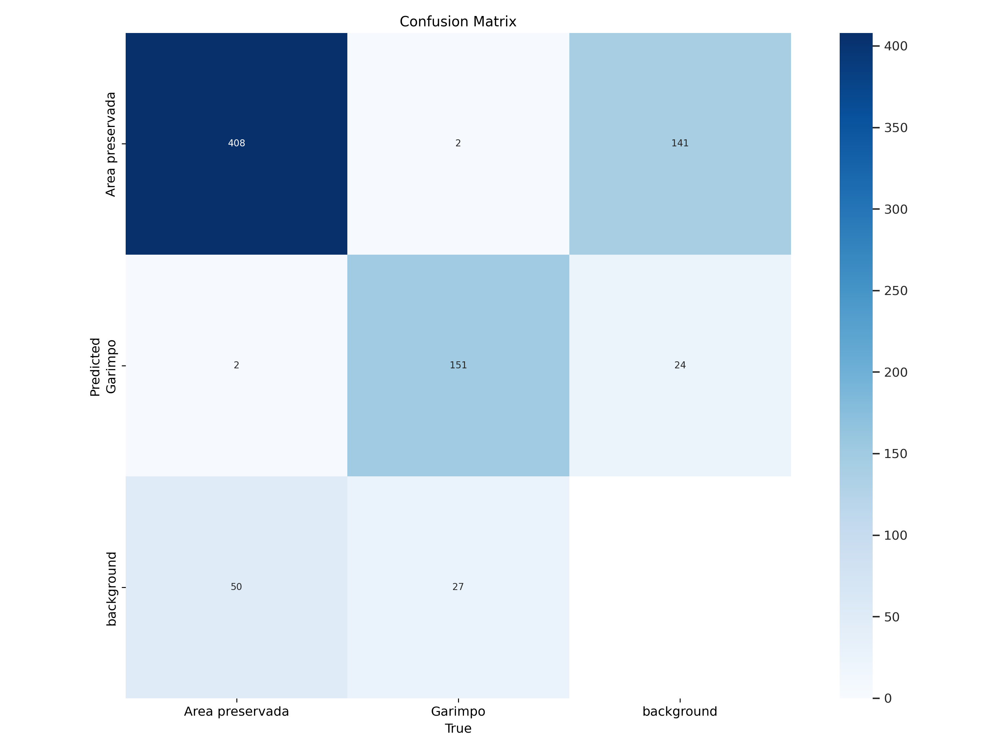

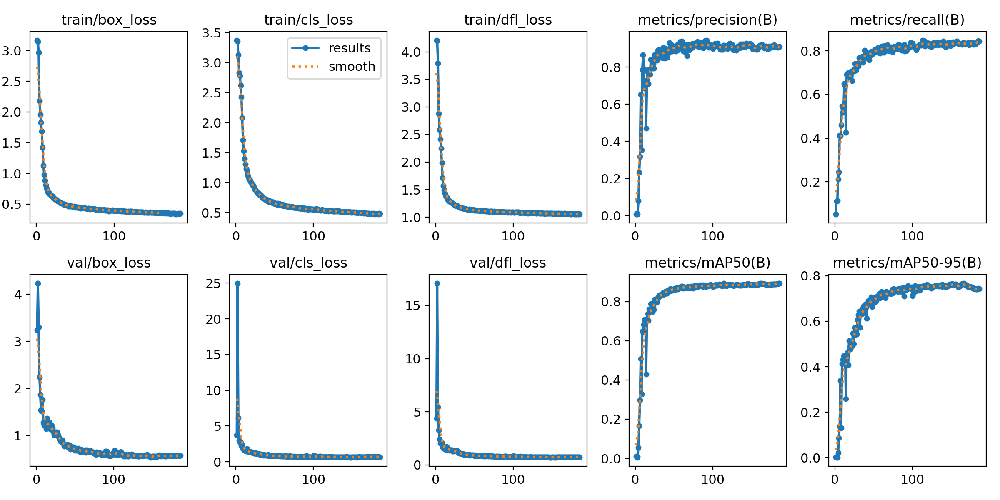

In [ ]:
from IPython.display import Image, display

# Caminho completo do arquivo (com pasta correta!)
confusion_matrix_path = '/content/drive/MyDrive/LiviaCecilia/yolov12/runs/detect/train20/confusion_matrix.png'
results_path = '/content/drive/MyDrive/LiviaCecilia/yolov12/runs/detect/train20/results.png'

display(Image(filename=confusion_matrix_path, width=1000))
display(Image(filename=results_path, width=1000))


# Calcular métricas do modelo

In [ ]:
import cv2
image = cv2.imread(f"{dataset.location}/test/images/1003_jpg.rf.9bf28d634b90620f4075c7437e01a035.jpg")

results = model(image)
print(results)



0: 640x640 4 Area preservadas, 1 Garimpo, 17.3ms
Speed: 3.9ms preprocess, 17.3ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
[ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
masks: None
names: {0: 'Area preservada', 1: 'Garimpo'}
obb: None
orig_img: array([[[ 76,  38,  26],
        [ 76,  38,  26],
        [ 81,  42,  33],
        ...,
        [ 27,  10,   1],
        [ 29,   9,   8],
        [ 20,   1,   4]],

       [[ 63,  25,  13],
        [ 54,  16,   4],
        [ 53,  14,   5],
        ...,
        [ 24,   6,   0],
        [ 25,   6,   3],
        [ 16,   0,   0]],

       [[ 52,  16,   6],
        [ 45,   9,   0],
        [ 49,  13,   3],
        ...,
        [ 26,  10,   0],
        [ 28,  11,   2],
        [ 18,   0,   0]],

       ...,

       [[ 94,  56,  22],
        [ 91,  56,  23],
        [ 59,  28,   5],
        ...,
        [ 68,  61,  18],
        [ 65,  56,  12],
       

In [ ]:
model = YOLO('runs/detect/train19/weights/best.pt')

# Avaliar no conjunto de teste
metrics = model.val(
    data=f'{dataset.location}/data.yaml',
    split='test',
    save_json=True
)

# Mostrar os mAPs
print(f"mAP50-95: {metrics.box.map:.3f}")
print(f"mAP50: {metrics.box.map50:.3f}")
print(f"mAP75: {metrics.box.map75:.3f}")


Ultralytics 8.3.63 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (NVIDIA L4, 22693MiB)
YOLOv12n summary (fused): 376 layers, 2,508,734 parameters, 0 gradients, 5.8 GFLOPs


val: Scanning /content/drive/MyDrive/LiviaCecilia/yolov12/IC---xGMobile-11/test/labels.cache... 300 images, 0 backgrounds, 0 corrupt: 100%|██████████| 300/300 [00:00<?, ?it/s]

val: WARNING ⚠️ /content/drive/MyDrive/LiviaCecilia/yolov12/IC---xGMobile-11/test/images/782_jpg.rf.1fc8124c1774f9dc628cd600e2bdbfef.jpg: 1 duplicate labels removed
WARNING ⚠️ Box and segment counts should be equal, but got len(segments) = 481, len(boxes) = 634. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:04<00:00,  4.40it/s]


                   all        300        634      0.951      0.871      0.915      0.822
       Area preservada        296        463      0.934      0.875      0.924      0.829
               Garimpo        151        171      0.967      0.867      0.906      0.815
Speed: 0.2ms preprocess, 3.0ms inference, 0.0ms loss, 1.9ms postprocess per image
Saving runs/detect/val6/predictions.json...
Results saved to runs/detect/val6
mAP50-95: 0.822
mAP50: 0.915
mAP75: 0.868


mAP 50:95 0.759960396952273
mAP 50 0.868272646812857
mAP 75 0.7989368384814362


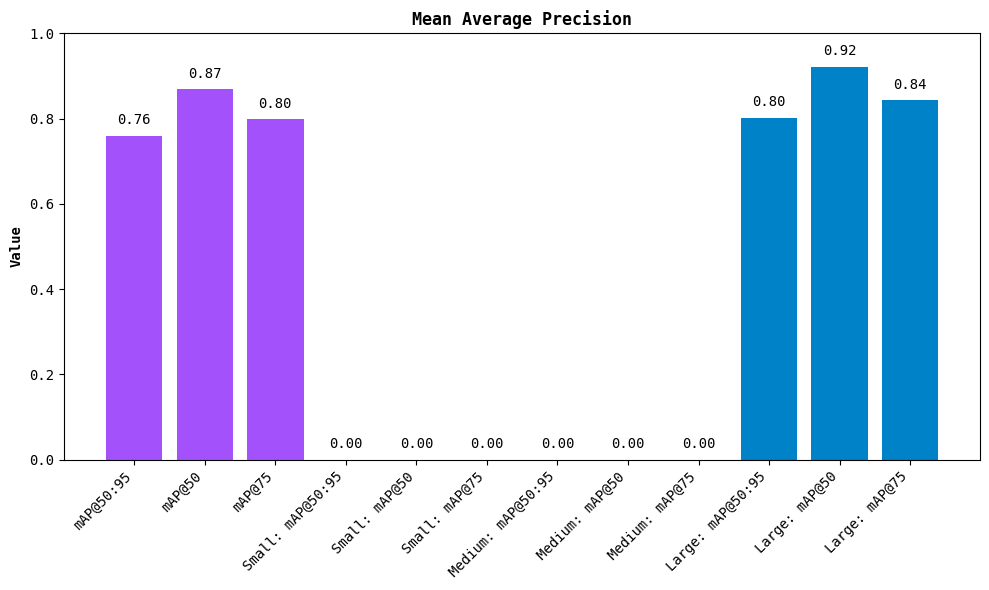

In [ ]:
from supervision.metrics import MeanAveragePrecision

ds = sv.DetectionDataset.from_yolo(
    images_directory_path=f"{dataset.location}/test/images",
    annotations_directory_path=f"{dataset.location}/test/labels",
    data_yaml_path=f"{dataset.location}/data.yaml"
)

model = YOLO('runs/detect/train19/weights/best.pt')

predictions = []
targets = []

for _, image, target in ds:
    results = model(image, verbose=False)[0]
    detections = sv.Detections.from_ultralytics(results)
    predictions.append(detections)
    targets.append(target)

map = MeanAveragePrecision().update(predictions, targets).compute()
print("mAP 50:95", map.map50_95)
print("mAP 50", map.map50)
print("mAP 75", map.map75)

map.plot()

In [ ]:
import os
from ultralytics import YOLO

# Caminho do diretório do projeto
project_dir = '/content/drive/MyDrive/LiviaCecilia/yolov12'

# Carregue o modelo treinado (o último melhor checkpoint)
model = YOLO(f'{project_dir}/runs/detect/train19/weights/best.pt')

# Avaliação do modelo no conjunto de validação
metrics = model.val(data=f'{project_dir}/runs/detect/train19/data.yaml')

# Exibindo as principais métricas
print("\n==== MÉTRICAS DO MODELO ====\n")

print(f"Acurácia (classificação correta): {metrics.box.map50:.4f}")  # Aproximação de acurácia no mAP50
print(f"Precisão (Precision): {metrics.box.precision:.4f}")
print(f"Recall: {metrics.box.recall:.4f}")
print(f"F1-Score: {(2 * metrics.box.precision * metrics.box.recall) / (metrics.box.precision + metrics.box.recall + 1e-6):.4f}")
print(f"mAP@0.5: {metrics.box.map50:.4f}")
print(f"mAP@0.5:0.95: {metrics.box.map:.4f}")
print(f"IoU: {metrics.box.map50:.4f}")  # Representando como IoU o mAP@0.5, mas se quiser o IoU médio tem que calcular manualmente.

# Tempo de inferência
print(f"Tempo de Inferência (por imagem): {metrics.speed['inference']:.2f} ms")

print("\n=============================\n")


# Inferência com o modelo treinado

In [ ]:
!yolo task=detect mode=predict model=/content/drive/MyDrive/LiviaCecilia/yolov12/runs/detect/train21/weights/best.pt conf=0.25 source=/content/drive/MyDrive/LiviaCecilia/duasimagens save=True

Ultralytics 8.3.63 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (NVIDIA L4, 22693MiB)
YOLOv12n summary (fused): 376 layers, 2,508,734 parameters, 0 gradients, 5.8 GFLOPs

image 1/5 /content/drive/MyDrive/LiviaCecilia/duasimagens/1.jpg: 384x640 4 Area preservadas, 1 Garimpo, 83.5ms
image 2/5 /content/drive/MyDrive/LiviaCecilia/duasimagens/2.jpg: 384x640 2 Area preservadas, 1 Garimpo, 16.3ms
image 3/5 /content/drive/MyDrive/LiviaCecilia/duasimagens/3.jpg: 384x640 3 Area preservadas, 1 Garimpo, 16.5ms
image 4/5 /content/drive/MyDrive/LiviaCecilia/duasimagens/4.jpg: 448x640 3 Area preservadas, 1 Garimpo, 77.9ms
image 5/5 /content/drive/MyDrive/LiviaCecilia/duasimagens/5.jpg: 448x640 2 Area preservadas, 1 Garimpo, 16.8ms
Speed: 3.1ms preprocess, 42.2ms inference, 75.9ms postprocess per image at shape (1, 3, 448, 640)
Results saved to runs/detect/predict7
💡 Learn more at https://docs.ultralytics.com/modes/predict


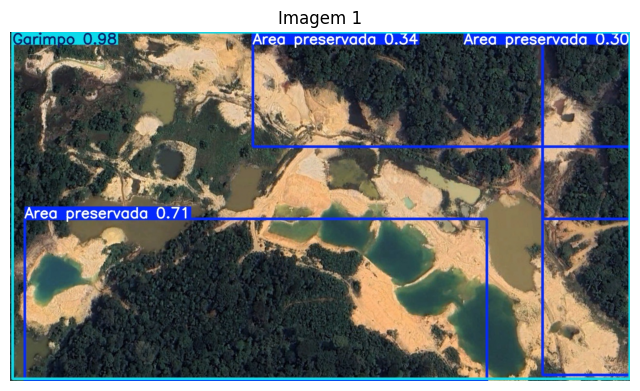

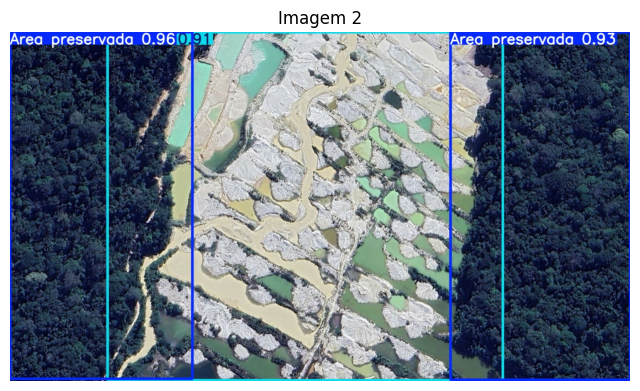

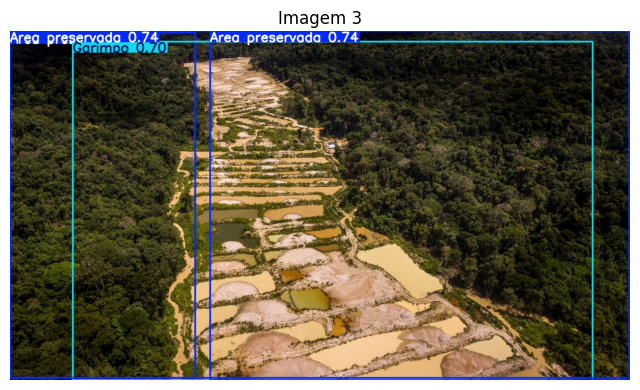

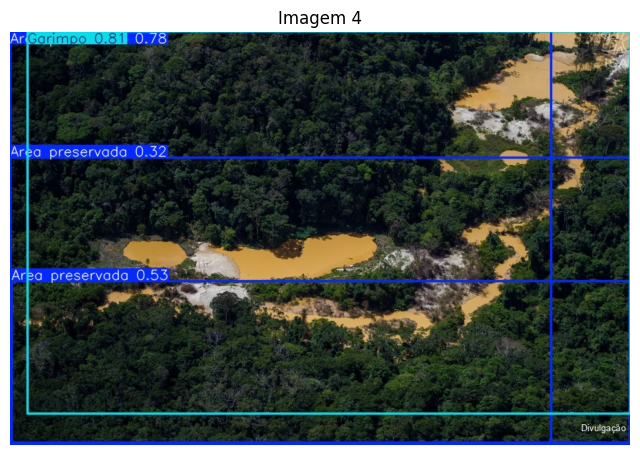

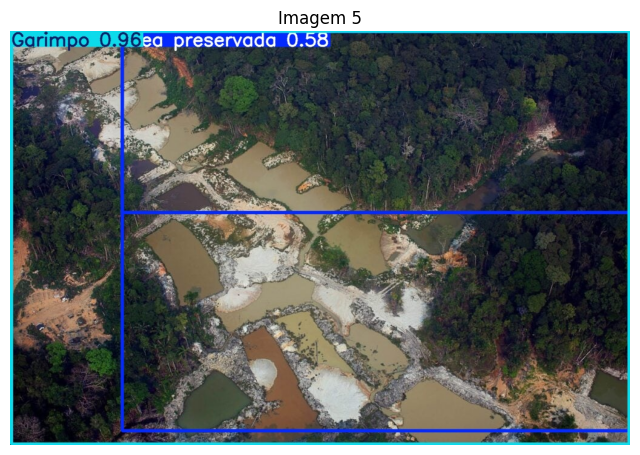

In [ ]:
import cv2
import matplotlib.pyplot as plt
import os

# Caminho para os resultados do YOLO
result_dir = 'runs/detect/predict7'

# Lista dos arquivos das imagens processadas
image_files = ['1.jpg', '2.jpg', '3.jpg', '4.jpg', '5.jpg']

# Exibir cada imagem individualmente
for i, file_name in enumerate(image_files):
    img_path = os.path.join(result_dir, file_name)
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    plt.figure(figsize=(8, 6))
    plt.imshow(img)
    plt.title(f'Imagem {i + 1}')
    plt.axis('off')
    plt.show()


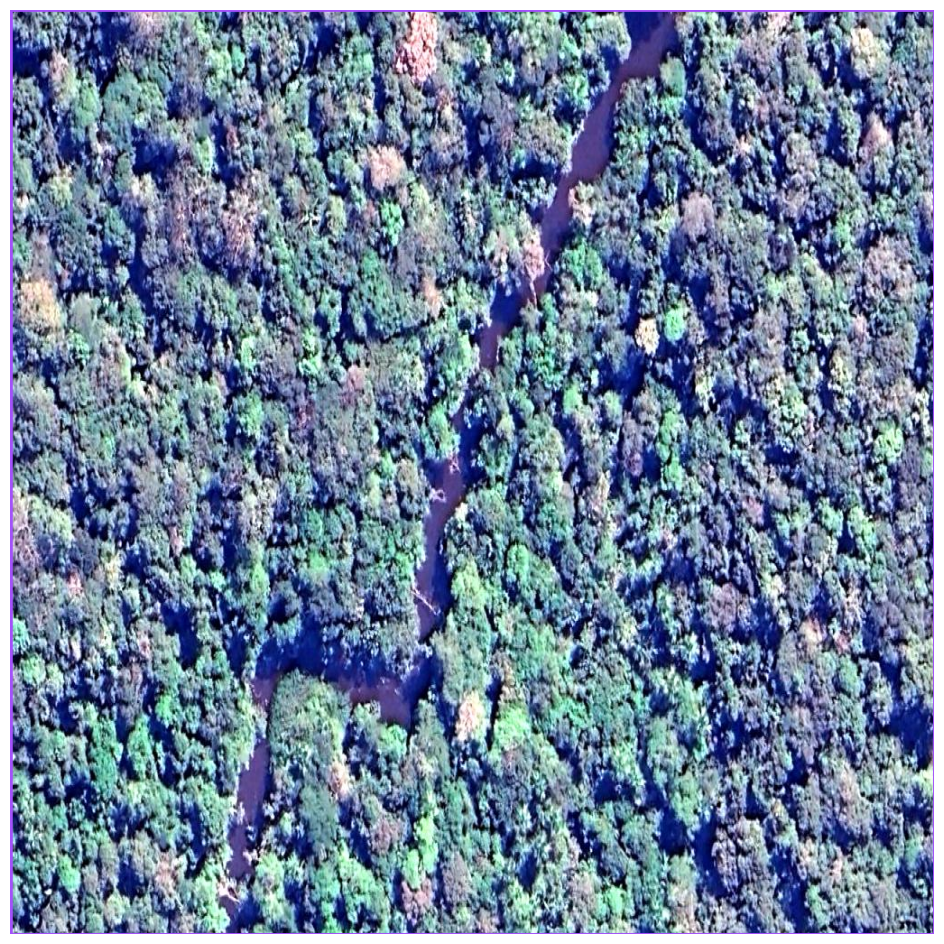

In [ ]:
import random
i = random.randint(0, len(ds))

image_path, image, target = ds[i]
results = model(image, verbose=False)[0]
detections = sv.Detections.from_ultralytics(results).with_nms()

box_annotator = sv.BoxAnnotator()
label_annotator = sv.LabelAnnotator()

annotated_image = image.copy()
annotated_image = box_annotator.annotate(scene=annotated_image, detections=detections)
annotated_image = label_annotator.annotate(scene=annotated_image, detections=detections)

sv.plot_image(annotated_image)


In [ ]:
# Caminho para a pasta
image_folder = '/content/drive/MyDrive/LiviaCecilia/duasimagens'

# Listar todos os arquivos de imagem
image_files = [f for f in os.listdir(image_folder) if f.endswith(('.jpg', '.jpeg', '.png'))]

print(f'Imagens encontradas: {image_files}')


Imagens encontradas: ['1.jpg', '2.jpg', '3.jpg', '4.jpg', '5.jpg']


In [ ]:
model = YOLO('runs/detect/train19/weights/best.pt')

In [ ]:
import locale
locale.getpreferredencoding = lambda: "UTF-8"
!yolo task=detect mode=predict model=/content/drive/MyDrive/LiviaCecilia/yolov12/runs/detect/train19/weights/best.pt conf=0.25 source=/content/drive/MyDrive/LiviaCecilia/Imagens_Dateset_Garimpo save=True

Ultralytics 8.3.63 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (NVIDIA L4, 22693MiB)
YOLOv12n summary (fused): 376 layers, 2,508,734 parameters, 0 gradients, 5.8 GFLOPs

image 1/1291 /content/drive/MyDrive/LiviaCecilia/Imagens_Dateset_Garimpo/1 (1).jpg: 384x640 1 Area preservada, 78.0ms
image 2/1291 /content/drive/MyDrive/LiviaCecilia/Imagens_Dateset_Garimpo/1.jpg: 384x640 2 Area preservadas, 1 Garimpo, 16.2ms
image 3/1291 /content/drive/MyDrive/LiviaCecilia/Imagens_Dateset_Garimpo/10 (1).jpg: 384x640 1 Area preservada, 16.3ms
image 4/1291 /content/drive/MyDrive/LiviaCecilia/Imagens_Dateset_Garimpo/10.jpg: 384x640 2 Area preservadas, 1 Garimpo, 19.5ms
image 5/1291 /content/drive/MyDrive/LiviaCecilia/Imagens_Dateset_Garimpo/100 (1).jpg: 384x640 1 Area preservada, 16.2ms
image 6/1291 /content/drive/MyDrive/LiviaCecilia/Imagens_Dateset_Garimpo/100.jpg: 384x640 2 Area preservadas, 1 Garimpo, 16.0ms
image 7/1291 /content/drive/MyDrive/LiviaCecilia/Imagens_Dateset_Garimpo/1000 (1).jpg: 384x640

In [ ]:
import time

# Comece o tempo antes de cada inferência
start_time = time.time()

# Aqui você faria a inferência com o YOLO, exemplo:
!yolo task=detect mode=predict model=/content/drive/MyDrive/LiviaCecilia/yolov12/runs/detect/train19/weights/best.pt conf=0.25 source=/content/drive/MyDrive/LiviaCecilia/Imagens_Dateset_Garimpo save=True

# Após a inferência, calcule o tempo gasto
end_time = time.time()
inferencia_tempo = (end_time - start_time) * 1000  # Convertendo para milissegundos

print(f"Tempo de inferência: {inferencia_tempo} ms")


Ultralytics 8.3.63 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (NVIDIA L4, 22693MiB)
YOLOv12n summary (fused): 376 layers, 2,508,734 parameters, 0 gradients, 5.8 GFLOPs

image 1/1291 /content/drive/MyDrive/LiviaCecilia/Imagens_Dateset_Garimpo/1 (1).jpg: 384x640 1 Area preservada, 78.6ms
image 2/1291 /content/drive/MyDrive/LiviaCecilia/Imagens_Dateset_Garimpo/1.jpg: 384x640 2 Area preservadas, 1 Garimpo, 15.9ms
image 3/1291 /content/drive/MyDrive/LiviaCecilia/Imagens_Dateset_Garimpo/10 (1).jpg: 384x640 1 Area preservada, 15.2ms
image 4/1291 /content/drive/MyDrive/LiviaCecilia/Imagens_Dateset_Garimpo/10.jpg: 384x640 2 Area preservadas, 1 Garimpo, 15.2ms
image 5/1291 /content/drive/MyDrive/LiviaCecilia/Imagens_Dateset_Garimpo/100 (1).jpg: 384x640 1 Area preservada, 15.6ms
image 6/1291 /content/drive/MyDrive/LiviaCecilia/Imagens_Dateset_Garimpo/100.jpg: 384x640 2 Area preservadas, 1 Garimpo, 15.3ms
image 7/1291 /content/drive/MyDrive/LiviaCecilia/Imagens_Dateset_Garimpo/1000 (1).jpg: 384x640

In [ ]:
!pip install ultralytics --upgrade

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 977.3/977.3 kB 22.9 MB/s eta 0:00:00


In [ ]:
!yolo task=detect mode=predict model=/content/drive/MyDrive/LiviaCecilia/yolov12/runs/detect/train21/weights/best.pt conf=0.40 source=/content/drive/MyDrive/LiviaCecilia/duasimagens save=True project='/content/drive/MyDrive/LiviaCecilia/yolov11/runs/detect/predict_unique' > logs.txt 2>&1

In [ ]:
import re

# Lê o arquivo de logs
with open("logs.txt", "r") as file:
    logs = file.readlines()

# Extrai os tempos de inferência (último valor antes de 'ms' em cada linha de imagem)
inference_times = []
for line in logs:
    if "image" in line and "ms" in line:
        time_match = re.search(r"(\d+\.\d+)ms", line)
        if time_match:
            inference_times.append(float(time_match.group(1)))

# Calcula a média
if inference_times:
    avg_time = sum(inference_times) / len(inference_times)
    print(f"✅ Tempo médio de inferência: {avg_time:.2f} ms (baseado em {len(inference_times)} imagens)")
else:
    print("❌ Nenhum tempo de inferência encontrado nos logs.")

✅ Tempo médio de inferência: 16.05 ms (baseado em 1292 imagens)


In [ ]:
from IPython.display import Image, display
import os

# Caminho do diretório contendo as imagens
image_folder = '/content/drive/MyDrive/LiviaCecilia/yolov12/runs/detect/predict/'

# Lista todos os arquivos no diretório e filtra apenas imagens com extensões específicas
image_files = [f for f in os.listdir(image_folder) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]

# Exibe cada imagem encontrada
for img_file in image_files:
    display(Image(filename=os.path.join(image_folder, img_file), width=600))


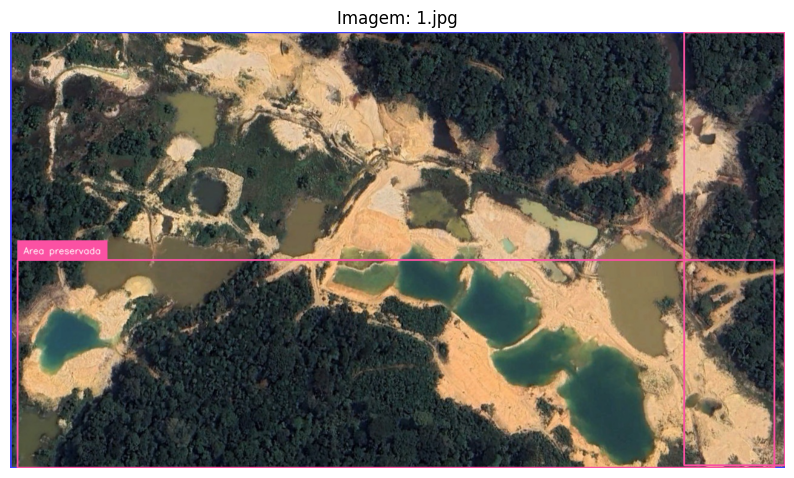

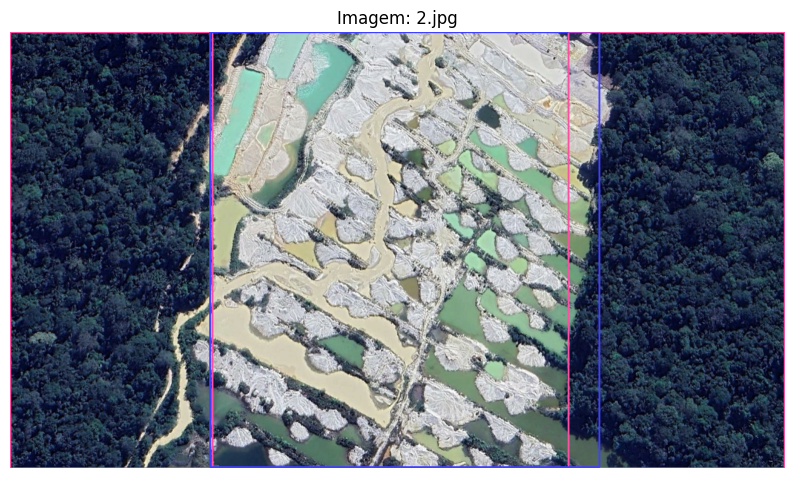

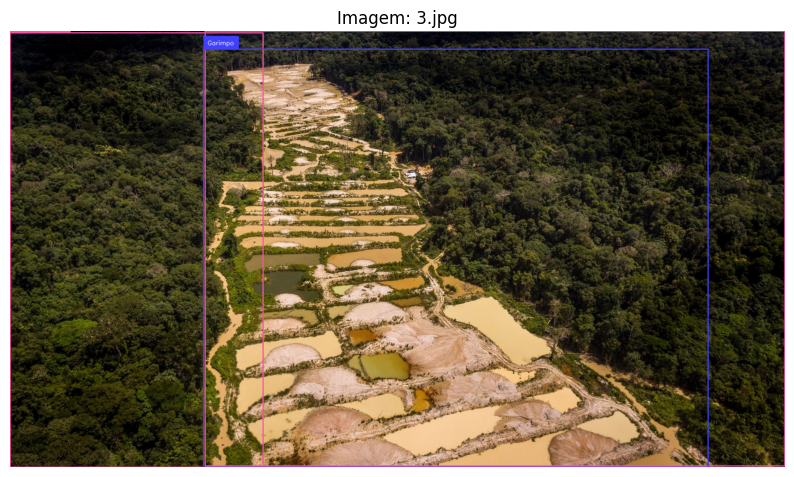

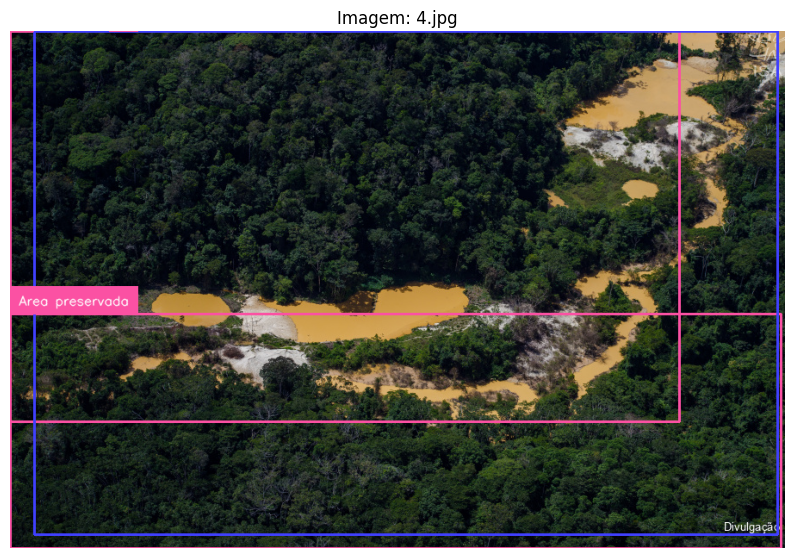

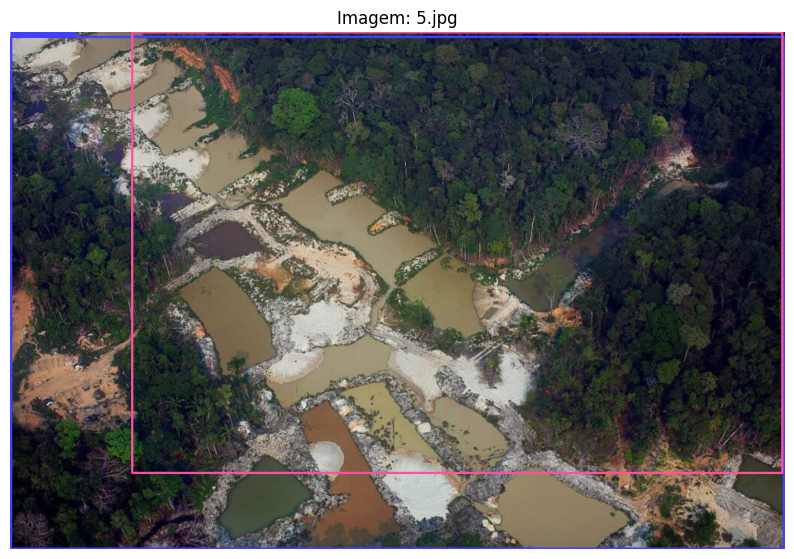

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os
import supervision as sv  # Se estiver usando Supervision para anotações
from ultralytics import YOLO

for img_file in image_files:
    image_path = os.path.join(image_folder, img_file)

    # Carrega a imagem
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Faz a inferência
    results = model.predict(source=image, verbose=False)[0]

    # Cria as detecções e aplica NMS
    detections = sv.Detections.from_ultralytics(results).with_nms()

    # Anota a imagem
    annotated_image = image.copy()
    annotated_image = sv.BoxAnnotator().annotate(scene=annotated_image, detections=detections)
    annotated_image = sv.LabelAnnotator().annotate(scene=annotated_image, detections=detections)

    # Exibe a imagem
    plt.figure(figsize=(10, 10))
    plt.imshow(annotated_image)
    plt.axis('off')
    plt.title(f'Imagem: {img_file}')
    plt.show()


In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
!pip install ultralytics --upgrade
!pip install nvidia-tensorrt --extra-index-url https://pypi.ngc.nvidia.com


  Using cached ultralytics-8.3.91-py3-none-any.whl.metadata (35 kB)
Using cached ultralytics-8.3.91-py3-none-any.whl (949 kB)
  Attempting uninstall: ultralytics
    Found existing installation: ultralytics 8.3.63
    Uninstalling ultralytics-8.3.63:
      Successfully uninstalled ultralytics-8.3.63


Looking in indexes: https://pypi.org/simple, https://pypi.ngc.nvidia.com


In [ ]:
from ultralytics import YOLO
import os

# Caminho do modelo YOLOv12 treinado
MODEL_PT_PATH = '/content/drive/MyDrive/LiviaCecilia/yolov12/runs/detect/train16/weights/best.pt'

# Carregue o modelo
model = YOLO(MODEL_PT_PATH)


In [ ]:
TRT_EXPORT_PATH = '/content/drive/MyDrive/LiviaCecilia/yolov12/tensorrt/'
os.makedirs(TRT_EXPORT_PATH, exist_ok=True)


In [ ]:
model.export(
    format='engine',         # Exporta para TensorRT Engine
    dynamic=False,           # Tamanhos fixos, mais rápido (opcional)
    simplify=True,           # Simplifica a arquitetura
    int8=True,               # Faz quantização para INT8
    imgsz=640,               # Resolucao usada no treino
    device=0,                # CUDA device 0
    half=False               # Se usar half, INT8 não faz sentido
)


Ultralytics 8.3.91 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (NVIDIA L4, 22693MiB)
WARNING ⚠️ INT8 export requires a missing 'data' arg for calibration. Using default 'data=coco8.yaml'.
YOLOv12n summary (fused): 175 layers, 2,508,734 parameters, 0 gradients


AttributeError: 'AAttn' object has no attribute 'qkv'

In [ ]:
!mv runs/detect/train16/weights/best.engine /content/drive/MyDrive/LiviaCecilia/yolov12/tensorrt/best_int8.engine


In [ ]:
TRT_ENGINE_PATH = '/content/drive/MyDrive/LiviaCecilia/yolov12/tensorrt/best_int8.engine'

# Carregue o modelo TensorRT
trt_model = YOLO(TRT_ENGINE_PATH)


In [ ]:
import cv2
import matplotlib.pyplot as plt

# Caminho das imagens para inferência
IMAGE_FOLDER = '/content/drive/MyDrive/LiviaCecilia/duasimagens'
image_files = [f for f in os.listdir(IMAGE_FOLDER) if f.endswith(('.jpg', '.jpeg', '.png'))]

# Loop para fazer inferência em todas as imagens
for img_file in image_files:
    image_path = os.path.join(IMAGE_FOLDER, img_file)
    image = cv2.imread(image_path)
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Inferência com TensorRT
    results = trt_model.predict(source=image_rgb, verbose=False)[0]

    # Exibir resultado
    plt.figure(figsize=(10, 10))
    plt.imshow(results.plot())  # Desenha as boxes
    plt.title(f'Inferência TensorRT: {img_file}')
    plt.axis('off')
    plt.show()
